In [45]:
import grewpy
import yaml
import sys
import numpy as np

sys.path.insert(1, '/Users/madalina/Documents/M2TAL/stage/grex/grex2')
import pyximport
pyximport.install()
import grex.data
import grex.utils
import grex.features

In [46]:
path = "/Users/madalina/Documents/M1TAL/stage-SK/Treebanks/UD_French-GSD-master"
grewpy.set_config('ud')
corpus = grewpy.Corpus(path)
draft = grewpy.CorpusDraft(corpus)

In [47]:
matches = corpus.search(grewpy.Request("X[upos=ADJ]"), clustering_parameter=['X.lemma'])

In [48]:
print(len(matches))

3684


In [5]:
print(matches)

{'évolué': [{'sent_id': 'fr-ud-train_02205', 'matching': {'nodes': {'X': '10'}, 'edges': {}}}, {'sent_id': 'fr-ud-dev_01398', 'matching': {'nodes': {'X': '17'}, 'edges': {}}}, {'sent_id': 'fr-ud-dev_00693', 'matching': {'nodes': {'X': '3'}, 'edges': {}}}], 'évolutif': [{'sent_id': 'fr-ud-train_11478', 'matching': {'nodes': {'X': '10'}, 'edges': {}}}], 'évident': [{'sent_id': 'fr-ud-train_14501', 'matching': {'nodes': {'X': '9'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_13279', 'matching': {'nodes': {'X': '5'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_12697', 'matching': {'nodes': {'X': '6'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_12577', 'matching': {'nodes': {'X': '17'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_09941', 'matching': {'nodes': {'X': '15'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_09683', 'matching': {'nodes': {'X': '5'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_08730', 'matching': {'nodes': {'X': '22'}, 'edges': {}}}, {'sent_id': 'fr-ud-train_05577', 'matching': {'nodes': {'

In [49]:
# The search space is defined using the yml file.
with open("patterns_adj.txt") as instream:
    config = yaml.load(instream, Loader=yaml.Loader)

templates = grex.utils.FeaturePredicate.from_config(config["templates"])
feature_predicate = grex.utils.FeaturePredicate.from_config(config["features"], templates=templates)

In [50]:
data = { k : list() for k in matches }
for adv, mts in matches.items():
    for match in mts:
        features = grex.data.extract_features(draft, match, feature_predicate)
        formatted_features = [
            f"{':'.join(k)}={v}" if not isinstance(v, set) else
            f"{':'.join(k)}={val}" for k, v in features.items() for val in (v if isinstance(v, set) else [v])
        ]
        data[adv].append(formatted_features)


In [8]:
print(data)

{'évolué': [['node:X:own:Gender=Masc', 'node:X:own:Number=Plur', 'node:X:own:rel_shallow=amod', 'node:X:parent:position=before', 'node:X:parent:Gender=Masc', 'node:X:parent:Number=Plur', 'node:X:parent:upos=NOUN'], ['node:X:own:Gender=Masc', 'node:X:own:Number=Plur', 'node:X:own:rel_shallow=root', 'node:X:parent:position=before', 'node:X:child:upos=ADV', 'node:X:child:upos=NOUN', 'node:X:child:upos=ADP', 'node:X:child:upos=AUX', 'node:X:child:upos=PUNCT', 'node:X:child:rel_shallow=punct', 'node:X:child:rel_shallow=cop', 'node:X:child:rel_shallow=nsubj', 'node:X:child:rel_shallow=advmod', 'node:X:child:Mood=Ind', 'node:X:child:Number=Plur', 'node:X:child:Person=3', 'node:X:child:Tense=Pres', 'node:X:child:VerbForm=Fin', 'node:X:child:ExtPos=ADV', 'node:X:child:Idiom=Yes', 'node:X:child:Gender=Masc'], ['node:X:own:Gender=Fem', 'node:X:own:Number=Plur', 'node:X:own:rel_shallow=amod', 'node:X:parent:position=before', 'node:X:parent:Gender=Fem', 'node:X:parent:Number=Plur', 'node:X:parent:u

In [51]:
unique_adv = sorted(set([k for k in data]))
unique_features = sorted(set([feat for _, matches in data.items() for m in matches for feat in m]))

idx2feature = {i : feat for i, feat in enumerate(unique_features) }
feature2idx = {feat : i for i, feat in idx2feature.items()}
idx2adv = {i : feat for i, feat in enumerate(unique_adv) }
adv2idx = {feat : i for i, feat in idx2adv.items()}

In [52]:
# Binary matrix, where the lines are the lemmas, features the columns, and values 0/1 indicating the presence of the feature for a given upos.
X = np.zeros((len(data.keys()), len(unique_features)))
for adv, samples in data.items():
    for m in samples:
        for feature in m:
            X[adv2idx[adv], feature2idx[feature]] = 1
print(f"{X.shape=}")

X.shape=(3684, 239)


In [53]:
X = np.zeros((len(data.keys()), len(unique_features)))
for adv, samples in data.items():
    n_samples = len(matches)
    for m in samples:
        for feature in m:
            X[adv2idx[adv], feature2idx[feature]] += 1
    X[adv2idx[adv]] = X[adv2idx[adv]] / n_samples
print(f"{X.shape=}")

X.shape=(3684, 239)


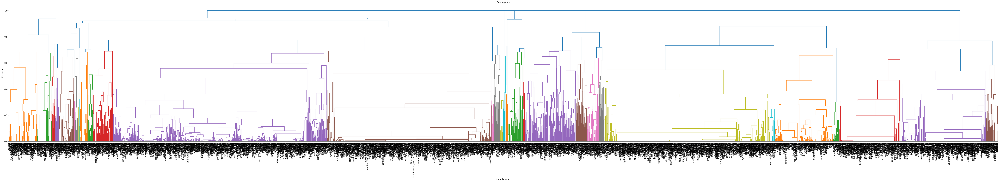

In [54]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, to_tree
import matplotlib.pyplot as plt

# Hamming or jacard for categorical data, cosine for sparse matrices (normally used in NLP)
# I compute the distance for each pair of lines, each POS
distance_matrix = pdist(X, metric='cosine')
# Complete -> we cluster 
linked = linkage(distance_matrix, method="complete", optimal_ordering=True)

plt.figure(figsize=(100, 14))

dn = dendrogram(linked,
                orientation='top',
                labels=[name for name in unique_adv],
                distance_sort='descending',
                show_leaf_counts=True,
                get_leaves=True)

plt.title('Dendrogram', fontsize=12)  # Increase title font size
plt.xlabel('Sample index', fontsize=12)  # Increase x-axis label font size
plt.ylabel('Distance', fontsize=12)  # Increase y-axis label font size
plt.xticks(fontsize=12)  # Increase x-tick labels font size
plt.yticks(fontsize=12)  # Increase y-tick labels font size
plt.show()

Given a dataset X and a linkage matrix Z, the cophenetic distance between two points of X is the distance between the largest two distinct clusters that each of the points belong to, explanation [here](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.cophenet.html#scipy.cluster.hierarchy.cophenet). To get the cophenetic distance between two points, you follow the lines from those points upwards until the two paths meet.The y-value of the horizontal line where the two paths come together is the cophenetic distance between those two points. This is the distance between the two largest clusters that contain each of the points, but not the other. good explanation as well [here](https://stats.stackexchange.com/questions/90881/determining-similar-users-from-hierarchical-clustering?noredirect=1&lq=1)

The cophenetic correlation for a cluster tree is defined as the linear correlation coefficient between the cophenetic distances obtained from the tree, and the original distances (or dissimilarities) used to construct the tree. Thus, it is a measure of how faithfully the tree represents the dissimilarities among observations, explanation [here](https://fr.mathworks.com/help/stats/cophenet.html)

In [22]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist, squareform

matrix = np.array(squareform(cophenet(linked)))

In [55]:
c, coph_dists = cophenet(linked, distance_matrix)
print(f'Cophenetic Correlation Coefficient: {c}')

Cophenetic Correlation Coefficient: 0.5165423152511519


In [23]:
from scipy.stats import skew, kurtosis


# Extract the upper triangular part excluding the diagonal
upper_triangular = matrix[np.triu_indices_from(matrix, k=1)]

# Calculate mean
mean_value = np.mean(upper_triangular)

# Calculate median
median_value = np.median(upper_triangular)

# Calculate standard deviation
std_deviation = np.std(upper_triangular)

# calculate variance
variance = np.var(upper_triangular)

# calculate maximum and minimum values
max_value = np.max(upper_triangular)
min_value = np.min(upper_triangular)

# calculate skewness
skewness = skew(upper_triangular)

# calculate kurtosis - measures how heavy-tailed or flat the distribution is.
kurtosis_result = kurtosis(upper_triangular)

# calculate spectral radius (largest eigenvalue)
spectral_radius = np.max(np.abs(np.linalg.eigvals(matrix)))

# calculate laplacian energy
laplacian_energy = np.sum(np.abs(np.linalg.eigvals(matrix)))

# Calculate sum
sum_value = np.sum(upper_triangular)


print(f"Mean: {mean_value}")
print(f"Median: {median_value}")
print(f"Standard Deviation: {std_deviation}")
print(f"Variance: {variance}")
print(f"Maximum: {max_value}")
print(f"Minimum: {min_value}")
print(f"Skewness: {skewness}")
print(f"Kurtosis: {kurtosis_result}")
print(f"Spectral Radius: {spectral_radius}")
print(f"Laplacian Energy: {laplacian_energy}")
print(f"Sum: {sum_value}")

Mean: 0.8756767408724868
Median: 1.0
Standard Deviation: 0.25770463217015865
Variance: 0.06641167744195678
Maximum: 1.0
Minimum: 0.0
Skewness: -2.364263373207937
Kurtosis: 4.514495912318711
Spectral Radius: 3242.515625381348
Laplacian Energy: 6485.031250762738
Sum: 5940666.318278666


Because of the different sample size between the different POS I will try different techniques to balance the effect

# 1. Random sample 

I will randomly sample 549 adjectives (so it matches the number of adverbs we've got) and redo the maths to see if we end up with the same conclusions

In [24]:
print(X.shape)

(3684, 239)


In [30]:
print(len(data))

3684


In [31]:
import random
# Get a list of keys from the original dictionary
keys = list(data.keys())

# Randomly select 549 keys
selected_keys = random.sample(keys, 549)

# Create a new dictionary with the selected keys
new_data = {key: data[key] for key in selected_keys}

print(f"New dictionary length: {len(new_data)}")

New dictionary length: 549


In [39]:
unique_adv = sorted(set([k for k in new_data]))
unique_features = sorted(set([feat for _, matches in new_data.items() for m in matches for feat in m]))

print(unique_adv)
print(unique_features)

idx2feature = {i : feat for i, feat in enumerate(unique_features) }
feature2idx = {feat : i for i, feat in idx2feature.items()}
idx2adv = {i : feat for i, feat in enumerate(unique_adv) }
adv2idx = {feat : i for i, feat in idx2adv.items()}

['13ième', '150ème', '159e', '19e', '1ère', '27èmes', '42e', '5e-6e', '85e', 'NP-complet', 'NP-difficile', 'US', 'VIIIe', 'Ve', 'acadien', 'accidenté', 'accro', 'acerbe', 'actionnarial', 'additionnel', 'adolescent', 'adverse', 'adéquat', 'affairiste', 'affreux', 'africain', 'africain-américain', 'agressif', 'agro-alimentaire', 'ajouté', 'alcalin', 'algébrique', 'aligné', 'aléatoire', 'amateur', 'amérindien', 'anal', 'anatomique', 'andin', 'angolais', 'anhédonique', 'annuel', 'anonyme', 'anti-bruit', 'anti-terroriste', 'antimafia', 'antimilitariste', 'antérieur', 'approprié', 'arabe', 'archaïque', 'argentin', 'aslien', 'astringent', 'athénien', 'atteignable', 'attractif', 'audiovisuel', 'authentique', 'autobiographique', 'autre', 'avide', 'aéroportuaire', 'babylonien', 'balsamique', 'balte', 'basique', 'basque', 'bestial', 'bicaméral', 'bienheureux', 'bifide', 'big', 'bimoteur', 'binomial', 'bloquant', 'boiteux', 'bosniaque', 'bossu', 'boursier', 'brabançon', 'brumeux', 'bulgare', 'byza

In [40]:
X = np.zeros((len(new_data.keys()), len(unique_features)))
for adv, samples in new_data.items():
    n_samples = len(matches)
    for m in samples:
        for feature in m:
            X[adv2idx[adv], feature2idx[feature]] += 1
    X[adv2idx[adv]] = X[adv2idx[adv]] / n_samples
print(f"{X.shape=}")

X.shape=(549, 171)


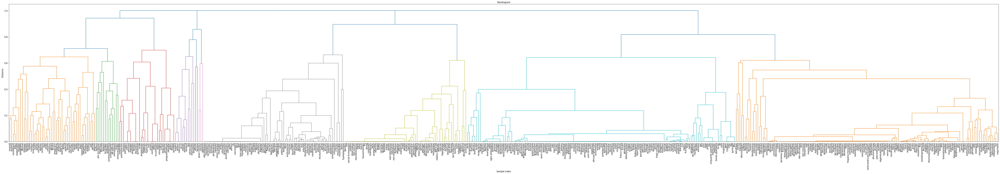

In [41]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, to_tree
import matplotlib.pyplot as plt

# Hamming or jacard for categorical data, cosine for sparse matrices (normally used in NLP)
# I compute the distance for each pair of lines, each POS
distance_matrix = pdist(X, metric='cosine')
# Complete -> we cluster 
linked = linkage(distance_matrix, method="complete", optimal_ordering=True)

plt.figure(figsize=(100, 14))

dn = dendrogram(linked,
                orientation='top',
                labels=[name for name in unique_adv],
                distance_sort='descending',
                show_leaf_counts=True,
                get_leaves=True)

plt.title('Dendrogram', fontsize=12)  # Increase title font size
plt.xlabel('Sample index', fontsize=12)  # Increase x-axis label font size
plt.ylabel('Distance', fontsize=12)  # Increase y-axis label font size
plt.xticks(fontsize=12)  # Increase x-tick labels font size
plt.yticks(fontsize=12)  # Increase y-tick labels font size
plt.show()

In [42]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist, squareform

matrix = np.array(squareform(cophenet(linked)))

In [44]:
c, coph_dists = cophenet(linked, distance_matrix)
print(f'Cophenetic Correlation Coefficient: {c}')

Cophenetic Correlation Coefficient: 0.5887618498810135


In [43]:
from scipy.stats import skew, kurtosis


# Extract the upper triangular part excluding the diagonal
upper_triangular = matrix[np.triu_indices_from(matrix, k=1)]

# Calculate mean
mean_value = np.mean(upper_triangular)

# Calculate median
median_value = np.median(upper_triangular)

# Calculate standard deviation
std_deviation = np.std(upper_triangular)

# calculate variance
variance = np.var(upper_triangular)

# calculate maximum and minimum values
max_value = np.max(upper_triangular)
min_value = np.min(upper_triangular)

# calculate skewness
skewness = skew(upper_triangular)

# calculate kurtosis
kurtosis_result = kurtosis(upper_triangular)

# calculate spectral radius (largest eigenvalue)
spectral_radius = np.max(np.abs(np.linalg.eigvals(matrix)))

# calculate laplacian energy
laplacian_energy = np.sum(np.abs(np.linalg.eigvals(matrix)))

# Calculate sum
sum_value = np.sum(upper_triangular)


print(f"Mean: {mean_value}")
print(f"Median: {median_value}")
print(f"Standard Deviation: {std_deviation}")
print(f"Variance: {variance}")
print(f"Maximum: {max_value}")
print(f"Minimum: {min_value}")
print(f"Skewness: {skewness}")
print(f"Kurtosis: {kurtosis_result}")
print(f"Spectral Radius: {spectral_radius}")
print(f"Laplacian Energy: {laplacian_energy}")
print(f"Sum: {sum_value}")

Mean: 0.8297433638273407
Median: 1.0
Standard Deviation: 0.29551494690631613
Variance: 0.08732908384504283
Maximum: 1.0
Minimum: 0.0
Skewness: -1.78643589923716
Kurtosis: 1.8515410678526267
Spectral Radius: 459.56034907964704
Laplacian Energy: 919.1206981592934
Sum: 124814.97524709156


# 2. Silhouette scores

If i calculate silhouette score on the original data for both adjectives and adverbs i should be able to draw conclusions without artifically removing elements from the category with more samples than the other

In [67]:
print(X.shape)

(3684, 239)


In [68]:
import numpy as np
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score

def find_optimal_clusters(X, max_clusters=20, metric='cosine', method='complete'):
    distance_matrix = pdist(X, metric=metric)
    linked = linkage(distance_matrix, method=method, optimal_ordering=True)
    
    silhouette_scores = []
    for num_clusters in range(2, max_clusters + 1):
        labels = fcluster(linked, num_clusters, criterion='maxclust')
        if len(np.unique(labels)) > 1:  # Ensure there is more than one cluster
            score = silhouette_score(X, labels, metric=metric)
            silhouette_scores.append(score)
            print(f'Number of clusters: {num_clusters}, Silhouette Score: {score}')
        else:
            silhouette_scores.append(-1)  # Append a low score if only one cluster
    
    optimal_clusters = np.argmax(silhouette_scores) + 2  # +2 because range starts from 2
    return optimal_clusters, silhouette_scores

# Find the optimal number of clusters
optimal_clusters, silhouette_scores = find_optimal_clusters(X, max_clusters=20)
print(f'Optimal number of clusters: {optimal_clusters}')

Number of clusters: 6, Silhouette Score: 0.23351200607850198
Number of clusters: 7, Silhouette Score: 0.28841695677436635
Number of clusters: 8, Silhouette Score: 0.2943892407234169
Number of clusters: 9, Silhouette Score: 0.30513690814870703
Number of clusters: 10, Silhouette Score: 0.30633105266992694
Number of clusters: 11, Silhouette Score: 0.3149132393484257
Number of clusters: 12, Silhouette Score: 0.31350776526873964
Number of clusters: 13, Silhouette Score: 0.32095862897593364
Number of clusters: 14, Silhouette Score: 0.3229077072619311
Number of clusters: 15, Silhouette Score: 0.32311530519537507
Number of clusters: 16, Silhouette Score: 0.3090323449271752
Number of clusters: 17, Silhouette Score: 0.30897788639217244
Number of clusters: 18, Silhouette Score: 0.30968814075488094
Number of clusters: 19, Silhouette Score: 0.28409117920119026
Number of clusters: 20, Silhouette Score: 0.28323291615053453
Optimal number of clusters: 15


In [70]:
# see what there is in each cluster
labels = fcluster(linked, optimal_clusters, criterion='maxclust')
clusters = {i: [] for i in range(1, optimal_clusters + 1)}
for i, label in enumerate(labels):
    clusters[label].append(i)

for cluster, members in clusters.items():
    print(f'Cluster {cluster}:')
    for member in members:
        print(f'  {unique_adv[member]}')


Cluster 1:
  IVème
  US
  acadien
  accru
  aciculaire
  additionnel
  adimensionnel
  affairiste
  affecté
  affreux
  afrikaans
  agraire
  agriculteur
  agréé
  ajusté
  alarmant
  algéro-libyen
  allié
  almohade
  alsacien
  alternatif
  aléoutien
  ambulant
  aminé
  amovible
  anabolisant
  analytique
  anatomique
  ancré
  andalou
  androgène
  anglo-américain
  anglo-canadien
  anglo-portugais
  anglo-saxon
  anglophone
  annexe
  annoncé
  anti-bruit
  antiaérien
  antibiotique
  anticipé
  anticolonialiste
  antifasciste
  antisémite
  approché
  arable
  aranéomorphe
  archaïque
  argileux
  aride
  aromatique
  arrageois
  arthrosique
  articulaire
  aslien
  astringent
  atmosphérique
  atteint
  atypique
  austronésien
  autochtone
  autogestionnaire
  automoteur
  autonomiste
  autoritaire
  aérodynamique
  babylonien
  balte
  baltique
  barbacoan
  barré
  basaltique
  bestial
  bi-objectif
  bicellulaire
  biellois
  bio
  biélorusse
  blond
  boisé
  bolivarien
  bo

In [74]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.decomposition import PCA
import plotly.express as px
import plotly.graph_objects as go

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a DataFrame for Plotly
df = pd.DataFrame({
    'PCA1': X_pca[:, 0],
    'PCA2': X_pca[:, 1],
    'Cluster': labels,
    'Word': unique_adv
})

# Create a scatter plot with Plotly
fig = go.Figure()

# Add traces for each cluster
for cluster in range(1, optimal_clusters + 1):
    cluster_data = df[df['Cluster'] == cluster]
    fig.add_trace(go.Scatter(
        x=cluster_data['PCA1'],
        y=cluster_data['PCA2'],
        mode='markers',
        marker=dict(size=10),
        name=f'Cluster {cluster}',
        text=cluster_data['Word'],
        hoverinfo='text'
    ))

# Update layout with dropdown menu
fig.update_layout(
    title='Word Clusters',
    xaxis_title='PCA1',
    yaxis_title='PCA2',
    updatemenus=[
        {
            'buttons': [
                {
                    'label': 'All Clusters',
                    'method': 'update',
                    'args': [{'visible': [True] * optimal_clusters},
                             {'title': 'All Clusters'}]
                }
            ] + [
                {
                    'label': f'Cluster {i}',
                    'method': 'update',
                    'args': [{'visible': [j == i - 1 for j in range(optimal_clusters)]},
                             {'title': f'Cluster {i}'}]
                } for i in range(1, optimal_clusters + 1)
            ],
            'direction': 'down',
            'showactive': True
        }
    ]
)

fig.show()

# 3. Calculate prediction strength to evaluate the stability of clustering results

It measures how consistently data points are assigned to the same clusters when the dataset is split into training and test sets. More info on this [here](https://therised.medium.com/determining-the-number-of-clusters-a-comprehensive-guide-1a2441c5a526)

In [66]:
# use the optimal number of clusters from the previous cell

import numpy as np
from scipy.spatial.distance import pdist, cdist
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.model_selection import train_test_split

def prediction_strength(X, num_clusters, test_size=0.5, metric='cosine', method='complete'):
    # Split the data into training and test sets
    X_train, X_test = train_test_split(X, test_size=test_size, random_state=42)
    
    # Perform hierarchical clustering on the training set
    distance_matrix_train = pdist(X_train, metric=metric)
    linked_train = linkage(distance_matrix_train, method=method, optimal_ordering=True)
    labels_train = fcluster(linked_train, num_clusters, criterion='maxclust')
    
    # Assign test set points to the nearest clusters from the training set
    centroids = np.array([X_train[labels_train == i].mean(axis=0) for i in range(1, num_clusters + 1)])
    distance_matrix_test = cdist(X_test, centroids, metric=metric)
    labels_test = np.argmin(distance_matrix_test, axis=1) + 1
    
    # Calculate prediction strength
    ps = 0
    for k in range(1, num_clusters + 1):
        train_cluster = X_train[labels_train == k]
        test_cluster = X_test[labels_test == k]
        if len(test_cluster) == 0:
            continue
        ps += np.mean([np.any(np.all(test_cluster == point, axis=1)) for point in train_cluster])
    
    ps /= num_clusters
    return ps

# print(X.shape)
num_clusters = 15
ps = prediction_strength(X, num_clusters)
print(f'Prediction Strength: {ps}')

Prediction Strength: 0.2142748604832028


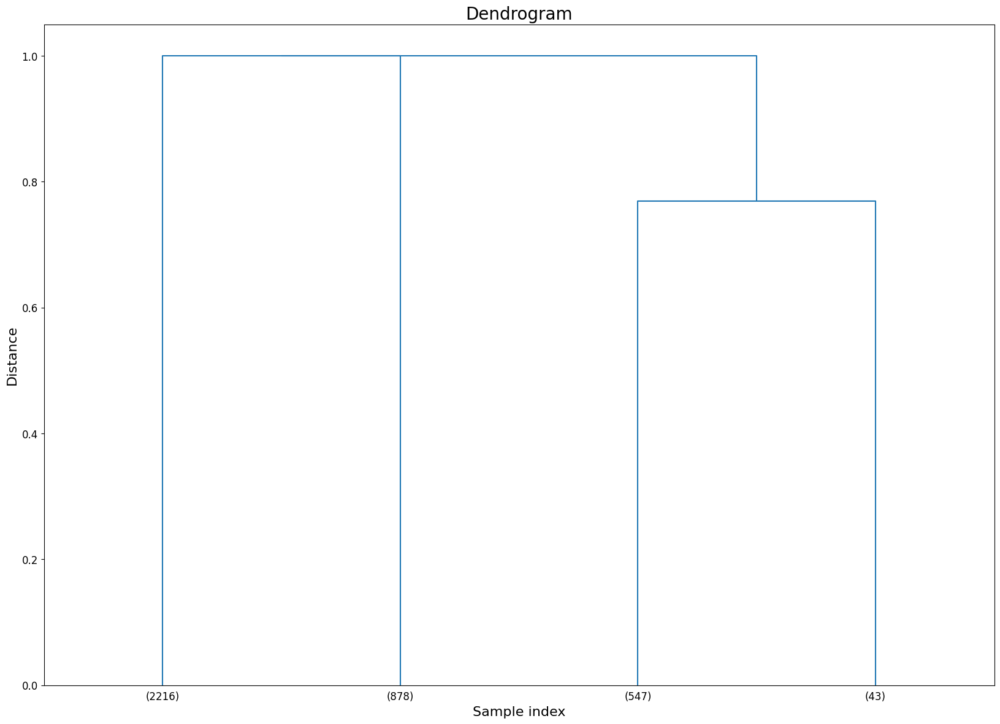

Cluster 1, 590: ['IVème', 'US', 'acadien', 'accru', 'aciculaire', 'additionnel', 'adimensionnel', 'affairiste', 'affecté', 'affreux', 'afrikaans', 'agraire', 'agriculteur', 'agréé', 'ajusté', 'alarmant', 'algéro-libyen', 'allié', 'almohade', 'alsacien', 'alternatif', 'aléoutien', 'ambulant', 'aminé', 'amovible', 'anabolisant', 'analytique', 'anatomique', 'ancré', 'andalou', 'androgène', 'anglo-américain', 'anglo-canadien', 'anglo-portugais', 'anglo-saxon', 'anglophone', 'annexe', 'annoncé', 'anti-bruit', 'antiaérien', 'antibiotique', 'anticipé', 'anticolonialiste', 'antifasciste', 'antisémite', 'approché', 'arable', 'aranéomorphe', 'archaïque', 'argileux', 'aride', 'aromatique', 'arrageois', 'arthrosique', 'articulaire', 'aslien', 'astringent', 'atmosphérique', 'atteint', 'atypique', 'austronésien', 'autochtone', 'autogestionnaire', 'automoteur', 'autonomiste', 'autoritaire', 'aérodynamique', 'babylonien', 'balte', 'baltique', 'barbacoan', 'barré', 'basaltique', 'bestial', 'bi-objectif

In [20]:
from scipy.cluster.hierarchy import dendrogram, fcluster
import matplotlib.pyplot as plt

# Plot the dendrogram with truncate_mode to see the cuts at different levels
plt.figure(figsize=(20, 14))
dn = dendrogram(linked,
                orientation='top',
                labels=[name for name in unique_adv],
                distance_sort='descending',
                show_leaf_counts=True,
                get_leaves=True,
                truncate_mode='level',  # Show only the top levels of the dendrogram
                p=1)  # Number of levels to show

plt.title('Dendrogram', fontsize=20)
plt.xlabel('Sample index', fontsize=16)
plt.ylabel('Distance', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

# Extract clusters at different levels
max_d = 0.90  # Set the maximum distance threshold for clustering
clusters = fcluster(linked, max_d, criterion='distance')

# Print the clusters
for cluster_id in set(clusters):
    cluster_elements = [unique_adv[i] for i in range(len(clusters)) if clusters[i] == cluster_id]
    print(f"Cluster {cluster_id}, {len(cluster_elements)}: {cluster_elements}")

In [57]:
from scipy.cluster.hierarchy import to_tree

def get_root_nodes_with_elements(linkage_matrix, labels):
    """Get the root nodes at each level of the hierarchical clustering tree with elements."""
    root, nodes = to_tree(linkage_matrix, rd=True)
    levels = {}

    def traverse(node, level=0):
        if level not in levels:
            levels[level] = []
        elements = node.pre_order(lambda x: labels[x.id] if x.is_leaf() else None)
        elements = [e for e in elements if e is not None]  # Filter out None values
        levels[level].append((node, elements))
        if not node.is_leaf():
            traverse(node.left, level + 1)
            traverse(node.right, level + 1)

    traverse(root)
    return levels

# Get the root nodes at each level with elements
root_nodes_with_elements = get_root_nodes_with_elements(linked, unique_adv)

# Print the root nodes at each level with elements
for level, nodes in root_nodes_with_elements.items():
    print(f"Level {level}:")
    for node, elements in nodes:
        print(f"  Node ID: {node.id}, Count: {node.count}, Elements: {elements}")

Level 0:
  Node ID: 1096, Count: 549, Elements: ['jusque', 'religieusement', 'implicitement', 'dessous', 'par-dessous', 'météorologiquement', 'sexuellement', 'thermodynamiquement', 'bis', 'environ', 'quelque', 'e.g.', 'mi', 'ter', 'en-dessous', 'vis-à-vis', 'hors-catégorie', 'durant', 'dessus-dessous', 'ci-après', 'quoique', 'perpendiculairement', 'penta-', 'cep.', 'secondairement', 'déca-', 'soit', 'tantôt', 'pseudo', 'par-dessus', 'méga', 'inconsciemment', 'i.e.', 'naguère', 'proportionnellement', 'usque', 'littéralement', 'N.B', 'assurément', 'postérieurement', 'accessoirement', 'physiologiquement', 'globalement', 'que', 'non', 'ne', 'pas', 'jamais', 'symboliquement', 'spécifiquement', 'fondamentalement', 'résolument', 'purement', 'logiquement', 'autrefois', 'jadis', 'vraisemblablement', 'anciennement', 'fort', 'nettement', 'presque', 'juste', 'tout', 'peu', 'plus', 'même', 'seulement', 'institutionnellement', 'délicieusement', 'faussement', 'hyper', 'trés', 'mutuellement', 'ultra',

In [34]:
class GrexQuery:
    def __init__(self, scope: str, conclusion: str = None, meta_conclusion: str = None):
        if conclusion is None and meta_conclusion is None:
            raise ValueError("At least one conclusion must be provided.")
        self.scope = scope
        self.conclusion = conclusion
        self.meta_conclusion = meta_conclusion

def get_clusters(linkage_matrix, mapping=None):
    """Explore the linked tree and extract all clusters"""
    _, cluster_nodes = to_tree(linkage_matrix, rd=True)
    clusters = list()
    for node in cluster_nodes:
        if not node.is_leaf():
            right_children_features = tuple(node.right.pre_order(lambda x: mapping[x.id] if mapping else x.id))
            left_children_features = tuple(node.left.pre_order(lambda x: mapping[x.id] if mapping else x.id))
            clusters.append((right_children_features, left_children_features))
    return clusters

adv_clusters = get_clusters(linked, idx2adv)

# scopes and conclusions
queries = [GrexQuery("|".join(cluster[0]) + "|" + "|".join(cluster[1]), "|".join(cluster[1])) for cluster in adv_clusters]

In [38]:
for c in adv_clusters:
    print(c)

(('assurément',), ('N.B',))
(('faussement',), ('délicieusement',))
(('hyper',), ('délicieusement', 'faussement'))
(('délicieusement', 'faussement', 'hyper'), ('institutionnellement',))
(('ultra',), ('mutuellement',))
(('sauvagement',), ('librement',))
(('affreusement',), ('copieusement',))
(('copieusement', 'affreusement'), ('doublement',))
(('illégalement',), ('doublement', 'copieusement', 'affreusement'))
(('doublement', 'copieusement', 'affreusement', 'illégalement'), ('injustement',))
(('minutieusement',), ('injustement', 'doublement', 'copieusement', 'affreusement', 'illégalement'))
(('injustement', 'doublement', 'copieusement', 'affreusement', 'illégalement', 'minutieusement'), ('mondialement',))
(('nouvellement',), ('mondialement', 'injustement', 'doublement', 'copieusement', 'affreusement', 'illégalement', 'minutieusement'))
(('mondialement', 'injustement', 'doublement', 'copieusement', 'affreusement', 'illégalement', 'minutieusement', 'nouvellement'), ('perpétuellement',))
(('

In [36]:
queries[3].scope, queries[3].conclusion

('délicieusement|faussement|hyper|institutionnellement',
 'institutionnellement')

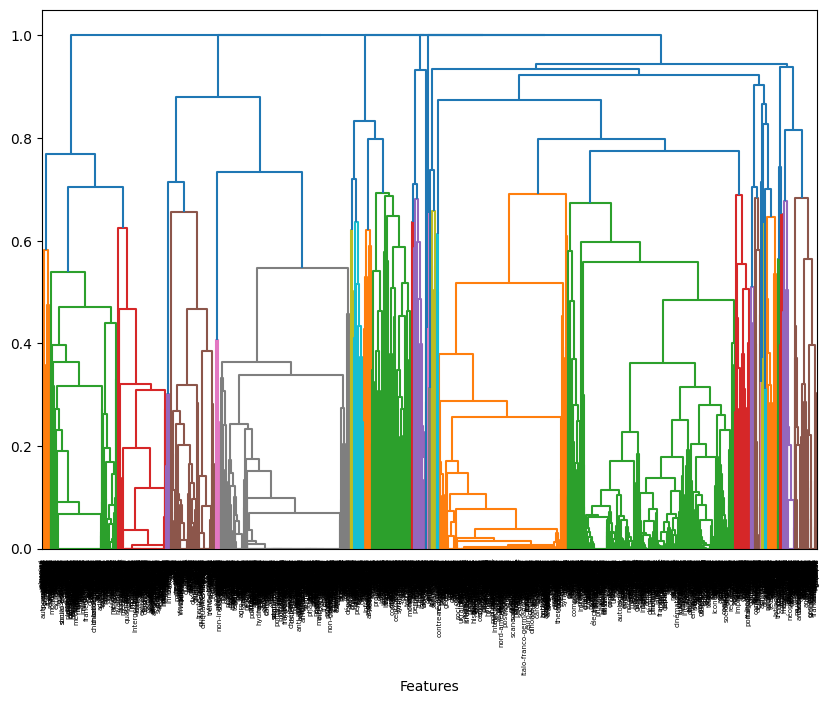

In [21]:
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):
    # a linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, labels=[name for name in unique_adv], **kwargs)

agglo = AgglomerativeClustering(compute_distances=True, linkage="complete", metric="cosine")
agglo.fit(X)

plt.figure(figsize=(10, 7))
plot_dendrogram(agglo)
plt.xlabel("Features")
plt.show()